## Please note i am keeping only the final code that is used in this file. Other EDA, and different trial of failed approaches is done in a separate file for reference

## Kindly see the cell outputs for reference. 

### Please make sure you have efficient net model downloaded or else download using this command in jupyter cell 
pip install efficientnet-pytorch

In [13]:
import torch
from torchvision import transforms
from efficientnet_pytorch import EfficientNet
from torch.utils.data import Dataset, DataLoader
import numpy as np
from scipy.linalg import inv
from sklearn.metrics import accuracy_score
from sklearn.decomposition import PCA, KernelPCA
import pickle
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd 
import warnings
warnings.filterwarnings('ignore')
from umap import UMAP

In [6]:
# tranformations on the data for efficientnet
transform = transforms.Compose([
    transforms.ToPILImage(),transforms.Resize((224, 224)),transforms.ToTensor(),  
    transforms.Normalize(mean=[0.485, 0.456, 0.406],std=[0.229, 0.224, 0.225])])

class EfficientNetDataset(Dataset):
    def __init__(self,images,transform=None):
        self.images=images
        self.transform=transform
    def __len__(self):
        return len(self.images)
    def __getitem__(self,idx):
        img=self.images[idx]
        if self.transform:
            img=self.transform(img)
        return img
model = EfficientNet.from_pretrained('efficientnet-b0')
model.eval() # model for feature extraction
with open(f'task_1_models/efficient/model.pkl','wb') as f:
    pickle.dump(model,f)
# Setting to cuda for speeding up, still keeping cpu code ready in case this file is being tested on a system that does not have gpu
device = torch.device("cuda" if torch.cuda.is_available() else "mps" if torch.backends.mps.is_available() else "cpu")
model.to(device)


Loaded pretrained weights for efficientnet-b0


EfficientNet(
  (_conv_stem): Conv2dStaticSamePadding(
    3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False
    (static_padding): ZeroPad2d((0, 1, 0, 1))
  )
  (_bn0): BatchNorm2d(32, eps=0.001, momentum=0.010000000000000009, affine=True, track_running_stats=True)
  (_blocks): ModuleList(
    (0): MBConvBlock(
      (_depthwise_conv): Conv2dStaticSamePadding(
        32, 32, kernel_size=(3, 3), stride=[1, 1], groups=32, bias=False
        (static_padding): ZeroPad2d((1, 1, 1, 1))
      )
      (_bn1): BatchNorm2d(32, eps=0.001, momentum=0.010000000000000009, affine=True, track_running_stats=True)
      (_se_reduce): Conv2dStaticSamePadding(
        32, 8, kernel_size=(1, 1), stride=(1, 1)
        (static_padding): Identity()
      )
      (_se_expand): Conv2dStaticSamePadding(
        8, 32, kernel_size=(1, 1), stride=(1, 1)
        (static_padding): Identity()
      )
      (_project_conv): Conv2dStaticSamePadding(
        32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False
    

In [3]:
def compute_class_prototypes(features,labels):
    unique_labels=np.unique(labels)
    prototypes={}
    for label in unique_labels:
        class_features = features[labels==label]
        prototypes[label]=np.mean(class_features,axis=0)  # Compute mean
    return prototypes

def mahalanobis_distance(x, mean, cov_matrix):
    diff= x - mean
    inv_cov=inv(cov_matrix)
    return np.sqrt(diff.T @ inv_cov @ diff)
def predict_lwp(features, prototypes, inv_cov_matrix):
    predictions = []
    for feature in features:
        distances = []
        for label, mean in prototypes.items():
            diff = feature - mean
            dist = np.sqrt(diff.T @ inv_cov_matrix @ diff)
            distances.append((label, dist))
        predictions.append(min(distances, key=lambda x: x[1])[0])
    return np.array(predictions)
def get_features_group13(file_path):
    #file_path="dataset/part_one_dataset/train_data/1_train_data.tar.pth"
    d=torch.load(file_path)
    data=d['data']  
    images=data  
    dataset=EfficientNetDataset(images, transform=transform)
    dataloader=DataLoader(dataset, batch_size=64, shuffle=False)
    features=[]
    for batch in dataloader:
        batch=batch.to(device)
        with torch.no_grad():
            feature_batch=model.extract_features(batch)  # trainign in batches to speed up 
            feature_batch=feature_batch.mean(dim=[2,3])  #Average pooling
            features.append(feature_batch.cpu())  
    features=torch.cat(features,dim=0)
    return features


In [7]:
with open(f'task_1_models/efficient/single/pca_{1}.pkl','rb') as f:
    pca=pickle.load(f)    
with open(f'task_1_models/efficient/single/cov_{10}.pkl','rb') as f:
    inv_cov_matrix=pickle.load(f) 
with open(f'task_1_models/efficient/single/prototypes_{10}.pkl','rb') as f:
    prototypes=pickle.load(f) 
features=get_features_group13(f'dataset/part_two_dataset/train_data/{1}_train_data.tar.pth')
reduced_features=pca.transform(features)
task_2_labels_to_start=predict_lwp(reduced_features,prototypes,inv_cov_matrix)

In [8]:
task_2_labels_to_start

array([3, 8, 8, ..., 9, 3, 3])

1
Training Accuracy Dataset 1: 0.736
2
dict_keys([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])
Training Accuracy Dataset 2: 0.9448
3
dict_keys([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])
Training Accuracy Dataset 3: 0.9888
4
dict_keys([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])
Training Accuracy Dataset 4: 0.9924
5
dict_keys([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])
Training Accuracy Dataset 5: 0.9904
6
dict_keys([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])
Training Accuracy Dataset 6: 0.9924
7
dict_keys([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])
Training Accuracy Dataset 7: 0.9928
8
dict_keys([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])
Training Accuracy Dataset 8: 0.9932
9
dict_keys([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])
Training Accuracy Dataset 9: 0.9876
10
dict_keys([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])
Training Accuracy Dataset 10: 0.9956
Model  1
Dataset 1
Evaluation Accuracy Dataset 1: 0.5712
Model  2
Dataset 1
Evaluation Accuracy Dataset 1: 0.564
Dataset 2
Evaluation Accuracy Dataset 2: 0.3696
Model  3
Dataset 1
Evaluation Accuracy Dataset 1: 0.5636
Dataset 2
Evaluation Ac

,dataset 1,dataset 2,dataset 3,dataset 4,dataset 5,dataset 6,dataset 7,dataset 8,dataset 9,dataset 10
model 1,0.5712,,,,,,,,,
model 2,0.5640,0.3696,,,,,,,,
model 3,0.5636,0.3696,0.5464,,,,,,,
model 4,0.5604,0.3692,0.5448,0.6404,,,,,,
model 5,0.5576,0.3664,0.5412,0.638,0.688,,,,,
model 6,0.5540,0.364,0.5396,0.636,0.6832,0.51,,,,
model 7,0.5504,0.3644,0.5368,0.6316,0.682,0.5064,0.6328,,,
model 8,0.5488,0.3644,0.536,0.6316,0.6796,0.5032,0.6308,0.5076,,
model 9,0.5480,0.3624,0.5376,0.6324,0.6788,0.5004,0.626,0.5064,0.5024,
model 10,0.5440,0.3628,0.5344,0.6296,0.6736,0.4996,0.6248,0.506,0.5036,0.6508


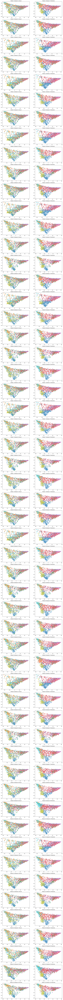

In [28]:
for data_set_num in [1,2,3,4,5,6,7,8,9,10]:
# for data_set_num in [1,2,3]:
    print(data_set_num)
    features=get_features_group13(f'dataset/part_two_dataset/train_data/{data_set_num}_train_data.tar.pth')
    if data_set_num==1:
        labels=task_2_labels_to_start
    else:
        labels=next_targets
    if data_set_num==1:
        pca_model=UMAP(n_components=20,n_neighbors=20,metric='manhattan',spread=100)
        reduced_features = pca_model.fit_transform(features)

    else:
        reduced_features = pca_model.transform(features)
    inv_cov_matrix = inv(np.cov(reduced_features, rowvar=False))  
    prototypes=compute_class_prototypes(reduced_features, labels)

    # Regularization 
    lambda_l2=0.01
    prototypes=pd.Series(prototypes).apply(lambda x: x - 0.01 * x).to_dict()
    
    if data_set_num!=1:
        # Weighted Update
        prototypes=((pd.Series(old_prototypes)*0.9) + (pd.Series(prototypes)*0.1)).to_dict()
        inv_cov_matrix=old_inv_cov_matrix*0.9 + inv_cov_matrix*0.1
        print(prototypes.keys())
    
    # save models
    if data_set_num==1:
        with open(f'task_1_models/efficient/task_2/pca_{data_set_num}.pkl','wb') as f:
            pickle.dump(pca_model,f)    
    with open(f'task_1_models/efficient/task_2/cov_{data_set_num}.pkl','wb') as f:
        pickle.dump(inv_cov_matrix,f)
    with open(f'task_1_models/efficient/task_2/prototypes_{data_set_num}.pkl','wb') as f:
        pickle.dump(prototypes,f)

    predictions=predict_lwp(reduced_features, prototypes, inv_cov_matrix)
    accuracy=accuracy_score(labels, predictions)
    print(f"Training Accuracy Dataset {data_set_num}: {accuracy}")

    # next pred
    if data_set_num!=10:
        features=get_features_group13(f'dataset/part_two_dataset/train_data/{data_set_num+1}_train_data.tar.pth')
        reduced_features=pca_model.transform(features)
        next_targets=predict_lwp(reduced_features, prototypes, inv_cov_matrix)
        old_prototypes=prototypes.copy()
        old_inv_cov_matrix=inv_cov_matrix.copy()
    

# finding accuracies matrix on heldout datasets
fig, ax=plt.subplots(55,2,figsize=(15,5*50))
fig_num=0
accuracy_matrix_final=[]
# for data_set_num in [1,2,3]:
for data_set_num in [1,2,3,4,5,6,7,8,9,10]:
    print('Model ',data_set_num)
    accuracy_matrix={1:None,2:None,3:None,4:None,5:None,6:None,7:None,8:None,9:None,10:None}
    with open(f'task_1_models/efficient/task_2/pca_{1}.pkl','rb') as f:
        pca_model=pickle.load(f)    
    with open(f'task_1_models/efficient/task_2/cov_{data_set_num}.pkl','rb') as f:
        inv_cov_matrix=pickle.load(f) 
    with open(f'task_1_models/efficient/task_2/prototypes_{data_set_num}.pkl','rb') as f:
        prototypes=pickle.load(f) 
    for x in range(1,data_set_num+1,1):
        print('Dataset',x)
        features=get_features_group13(f'dataset/part_two_dataset/eval_data/{x}_eval_data.tar.pth')
        d = torch.load(f'dataset/part_two_dataset/eval_data/{x}_eval_data.tar.pth')
        labels=d['targets']        
        reduced_features=pca_model.transform(features)

        predictions=predict_lwp(reduced_features, prototypes, inv_cov_matrix)
        accuracy=accuracy_score(labels, predictions)
        print(f"Evaluation Accuracy Dataset {x}: {accuracy}")
        accuracy_matrix[x]=accuracy

        sns.scatterplot(ax=ax[fig_num][0],x=reduced_features[:,0],y=reduced_features[:,1],hue=labels,palette=sns.color_palette("tab10", 10),legend=False).set_title(f'Model {data_set_num} Dataset {x} Actual')
        sns.scatterplot(ax=ax[fig_num][1],x=reduced_features[:,0],y=reduced_features[:,1],hue=predictions,palette=sns.color_palette("tab10", 10),legend=False).set_title(f'Model {data_set_num} Dataset {x} Predicted')
        fig_num=fig_num+1
    accuracy_matrix_final.append(accuracy_matrix)
fig.savefig('task_1_models/efficient/task_2/result_plots_pca.png')
accuracy_matrix_final2=pd.DataFrame(accuracy_matrix_final).fillna('')
accuracy_matrix_final2.index=['model 1','model 2','model 3','model 4','model 5','model 6','model 7','model 8','model 9','model 10']
accuracy_matrix_final2.columns='dataset '+ pd.Series(accuracy_matrix_final2.columns).astype(str)
accuracy_matrix_final2 # not significant drop in previous datasets by ith model, but overall accuracy is not good
    


In [29]:
fig.savefig('task_1_models/efficient/task_2/result_plots_pca_task2.pdf',format='pdf')

In [ ]:
# clearly Dataset 2 is problematic in general and our model is not able to generalize well for it, as compared to rest of models/datasets